### Face Detection using DLTK

#### Introduction

> Face detection is a computer technology being used in a variety of applications that identifies human faces in digital images.
    ~[wikipedia](https://en.wikipedia.org/wiki/Face_detection)

As part of this Notebook we will use DLTK to get Face Detection output from various open source (MTCNN, openCV, Dlib) face detectors & 3rd party AI engines like Azure

In [1]:
# If you are running this notebook on GOOGLE COLAB, uncomment below code & run this cell

# !git clone https://github.com/dltk-ai/qubitai-dltk.git
# %cd qubitai-dltk

#### Import packages

In [3]:
from PIL import Image
import json

import sys
sys.path.append("../../")

from dltk_ai.visualization import draw_bbox

#### Read Image

In [ ]:
img_path = "./examples/data/image/face_analytics_sample_1.jpg"
img = Image.open(img_path)
img

#### setup

> <u>Parameters Descriptions</u>
>
> **API key**: `If authentication is enabled`, you need to provide a valid API key
>
> **base_url**: url where kong/base service provided by OpenDLTK is deployed.

In [5]:
import dltk_ai
client = dltk_ai.DltkAiClient(base_url='http://localhost:8000')

<div class="alert alert-block alert-info">
<b>See Also:</b> 

 

1. [How to generate API key](https://docs.dltk.ai/qubitai-dltk/docs/build/html/getting_started/generateAPIkey.html)
2. [OpenDLTK deployment](http://docs.dltk.ai/qubitai-dltk/docs/build/html/getting_started/openDLTK_setup.html)

 

</div>

In [6]:
face_analytics_response = client.face_analytics(image_path=img_path, face_detectors=['mtcnn'], output_types=['json'])

In [7]:
face_analytics_response = client.check_cv_job(face_analytics_response['task_id'])
face_analytics_response

{'task_status': 'SUCCESS',
 'task_id': '6849e71e-f455-4267-adb1-4213ca3d6378',
 'output': {'mtcnn': {'json': {'face_locations': [{'x': 394,
      'y': 429,
      'w': 38,
      'h': 47},
     {'x': 645, 'y': 401, 'w': 41, 'h': 50},
     {'x': 745, 'y': 417, 'w': 38, 'h': 49},
     {'x': 986, 'y': 368, 'w': 41, 'h': 52},
     {'x': 265, 'y': 371, 'w': 44, 'h': 59},
     {'x': 1088, 'y': 401, 'w': 40, 'h': 52},
     {'x': 875, 'y': 363, 'w': 42, 'h': 54},
     {'x': 1309, 'y': 357, 'w': 45, 'h': 57},
     {'x': 1218, 'y': 408, 'w': 44, 'h': 57},
     {'x': 515, 'y': 411, 'w': 44, 'h': 58}],
    'face_landmarks': [{'left_eye': [406, 444],
      'right_eye': [423, 445],
      'nose': [415, 453],
      'mouth_left': [405, 462],
      'mouth_right': [422, 464]},
     {'left_eye': [658, 421],
      'right_eye': [677, 420],
      'nose': [669, 433],
      'mouth_left': [659, 440],
      'mouth_right': [676, 440]},
     {'left_eye': [755, 434],
      'right_eye': [773, 435],
      'nose': [763,

#### Visualization of output

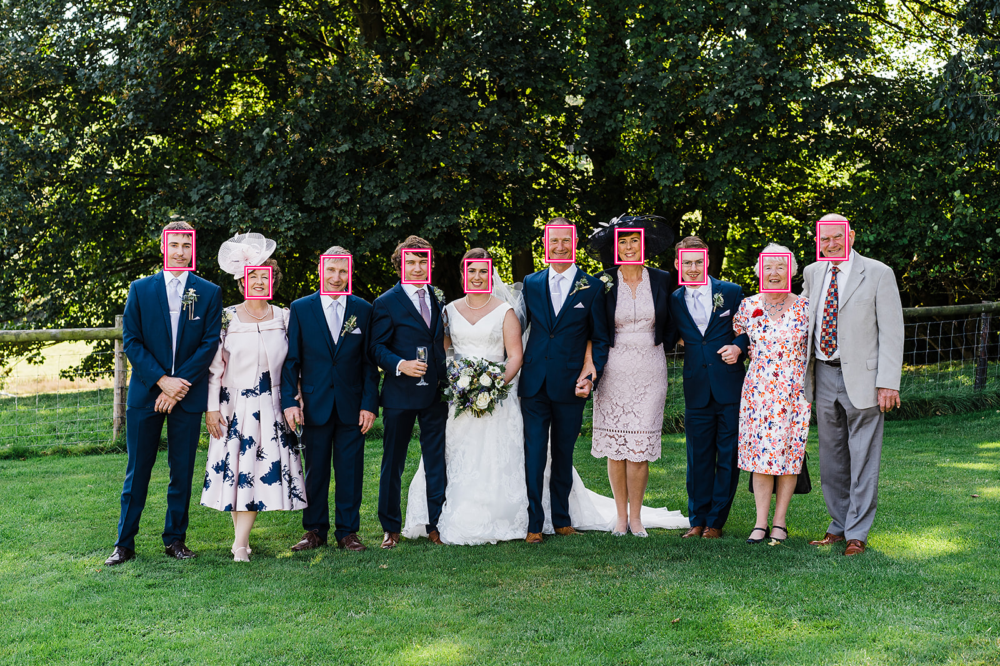

In [8]:
mtcnn_bboxes =  face_analytics_response['output']['mtcnn']['json']['face_locations']
mtcnn_bboxes = [box.values() for box in mtcnn_bboxes]

output_image = draw_bbox(img, mtcnn_bboxes,coords_order='xywh')
output_image

In [9]:
output_image.save("face_detection_output.jpg")

#### Using Third Party Face Detectors

<div class="alert alert-block alert-danger"> <b>Caution:</b> Run below cell, only if <b>Supported AI Engine Credentials</b> are updated in openDLTK configurations while installation </div>

In [10]:
face_analytics_response = client.face_analytics(image_path = img_path, face_detectors=['azure'])

face_analytics_response

{'task_status': 'SUCCESS',
 'task_id': '4487ae29-9d49-4769-a17f-a65614708159',
 'output': {'azure': {'json': {'face_locations': [{'x': 514,
      'y': 421,
      'w': 46,
      'h': 46},
     {'x': 645, 'y': 408, 'w': 45, 'h': 45},
     {'x': 265, 'y': 382, 'w': 45, 'h': 45},
     {'x': 1217, 'y': 417, 'w': 44, 'h': 44},
     {'x': 985, 'y': 374, 'w': 43, 'h': 43},
     {'x': 1311, 'y': 369, 'w': 43, 'h': 43},
     {'x': 393, 'y': 432, 'w': 42, 'h': 42},
     {'x': 1088, 'y': 409, 'w': 42, 'h': 42},
     {'x': 875, 'y': 374, 'w': 42, 'h': 42},
     {'x': 744, 'y': 424, 'w': 39, 'h': 39}]}}}}

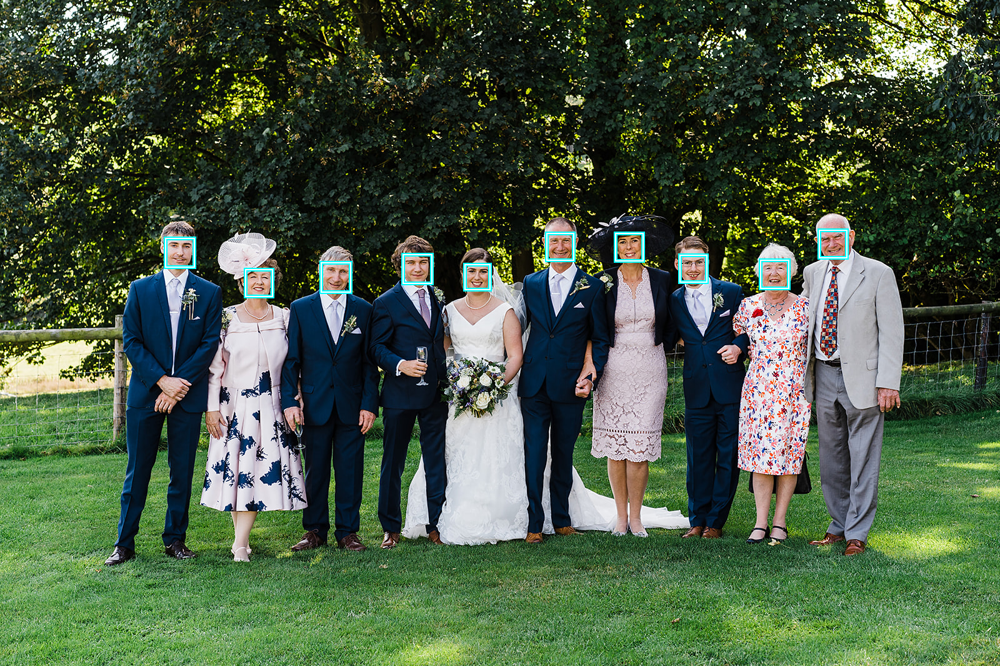

In [11]:
azure_bboxes =  face_analytics_response['output']['azure']['json']['face_locations']
azure_bboxes = [box.values() for box in azure_bboxes]

output_image = draw_bbox(img, azure_bboxes,coords_order='xywh', bbox_color=(0,255,255))
output_image

### Comparing Face Detectors

In this section, we can overlay the output of various face detectors on same image and compare their output.

<div class="alert alert-block alert-danger"> <b>Caution:</b> Run below cell, only if <b>Supported AI Engine Credentials</b> are updated in openDLTK configurations while installation </div>

In [13]:
face_analytics_response = client.face_analytics(image_path = img_path, face_detectors = ['azure','mtcnn'])

face_analytics_response

{'task_status': 'SUCCESS',
 'task_id': 'a57d9e49-5568-4fe9-9a34-f491e3f65bfd',
 'output': {'mtcnn': {'json': {'face_locations': [{'x': 394,
      'y': 429,
      'w': 38,
      'h': 47},
     {'x': 645, 'y': 401, 'w': 41, 'h': 50},
     {'x': 745, 'y': 417, 'w': 38, 'h': 49},
     {'x': 986, 'y': 368, 'w': 41, 'h': 52},
     {'x': 265, 'y': 371, 'w': 44, 'h': 59},
     {'x': 1088, 'y': 401, 'w': 40, 'h': 52},
     {'x': 875, 'y': 363, 'w': 42, 'h': 54},
     {'x': 1309, 'y': 357, 'w': 45, 'h': 57},
     {'x': 1218, 'y': 408, 'w': 44, 'h': 57},
     {'x': 515, 'y': 411, 'w': 44, 'h': 58}],
    'face_landmarks': [{'left_eye': [406, 444],
      'right_eye': [423, 445],
      'nose': [415, 453],
      'mouth_left': [405, 462],
      'mouth_right': [422, 464]},
     {'left_eye': [658, 421],
      'right_eye': [677, 420],
      'nose': [669, 433],
      'mouth_left': [659, 440],
      'mouth_right': [676, 440]},
     {'left_eye': [755, 434],
      'right_eye': [773, 435],
      'nose': [763,

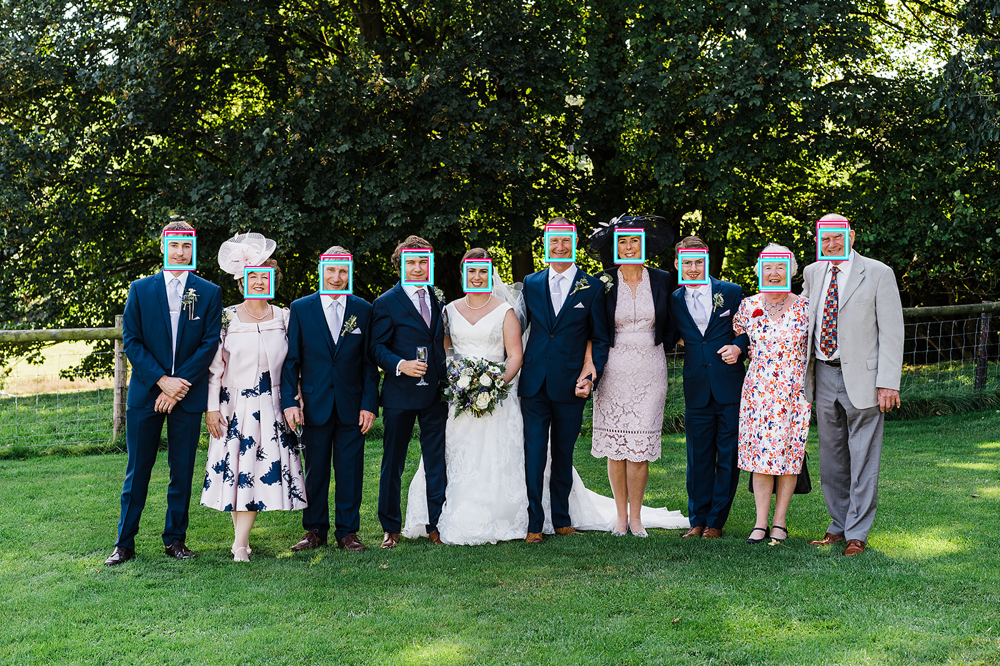

In [14]:
mtcnn_bboxes =  face_analytics_response['output']['mtcnn']['json']['face_locations']
mtcnn_bboxes = [box.values() for box in mtcnn_bboxes]

mtcnn_output_image = draw_bbox(img, mtcnn_bboxes,coords_order='xywh')


azure_bboxes =  face_analytics_response['output']['azure']['json']['face_locations']
azure_bboxes = [box.values() for box in azure_bboxes]

combined_output_image = draw_bbox(mtcnn_output_image, azure_bboxes, coords_order='xywh', bbox_color=(0,255,255))
combined_output_image


#### References

For more detail on using Face Detection API please refer [DLTK Face Detection Documentation](https://docs.dltk.ai/computer_vision/index.html#face-detection)

<center><b>For More Details about DLTK</b></center>

|[<img src="https://pbs.twimg.com/profile_images/909757546063323137/-RIWgodF.jpg" width=50 title="Pypi Logo"/>](https://pypi.org/project/qubitai-dltk/) |[<img src="https://cdn.iconscout.com/icon/free/png-512/documentation-1502741-1272951.png" width=50 title="Documentation"/>](https://docs.dltk.ai) | [<img src="https://cdn4.iconfinder.com/data/icons/iconsimple-logotypes/512/github-512.png" width=50 title="Documentation"/>](https://docs.dltk.ai)| 
|:-------------:|:-------:|:--------:|
|pypi|Documentation|Github|